In [1]:
import pandas as pd
import os
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import emoji
import time
import plotly.express as px
from concurrent.futures import ProcessPoolExecutor
from textblob import TextBlob
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
from nltk.corpus import sentiwordnet as swn
from nltk.corpus import wordnet as wn
from nltk.tokenize import word_tokenize
from nltk import pos_tag
from nltk.stem import WordNetLemmatizer

In [2]:
# Set working directory
work_dir = os.path.join(os.getcwd(), "../")
os.chdir(work_dir)

In [3]:
# Reading in final user reviews (fully cleaned) dataset
user_reviews_df = pd.read_csv('data/yelp_reviews_users_Phila_final.csv')

In [4]:
# Cleaning review column
def cleanText(text):
    # Making words lowercase
    text = text.lower()

    # Replacing instances of multiple whitespaces with single whitespaces and removing leading and trailing whitespaces
    text = re.sub(r'\s+', ' ', text).strip()

    # Removing emojis
    text = emoji.demojize(text)

    # Removing URLS
    text = re.sub(r'\s*http(s?)\S+|\s*www\S+', '', text)

    # Removing Emails
    text = re.sub(r'[a-zA-Z0-9._%+-]+@[a-zA-Z0-9]+\.[a-zA-Z]{2,}', '', text)

    # Removing stopwords
    stop_words = set(stopwords.words('english'))
    text = ' '.join(word for word in text.split() if word not in stop_words)
    
    return text

#Cleaning text
user_reviews_df['review_cleaned'] = user_reviews_df['review'].apply(cleanText)

In [5]:
user_reviews_df['review_cleaned']

0        absolutely nothing wrong restaurant, quite lik...
1        great place brunch! portions certain dishes co...
2        fiance loves french food, birthday made reserv...
3        delicious food, great ambiance, excellent serv...
4        met friend lunch disappointed bunch reasons. c...
                               ...                        
90386    food mediocre, coming middle eastern backgroun...
90387    looking turkish spot city paprica definitely o...
90388    great authentic turkish food. trued papri̇ca l...
90389    delicious turkish dining. chicken shish kebab ...
90390    paprica cosmopolitan place hear many languages...
Name: review_cleaned, Length: 90391, dtype: object

In [6]:
# Computing sentiment scores using vaderSentiment
# Function to initialize SentimentIntensityAnalyzer and compute sentiment scores
def getSIA(text):
    sia = SentimentIntensityAnalyzer()
    sentiment = sia.polarity_scores(text)
    compound = sentiment['compound']
    return compound

start_time = time.time()
user_reviews_df['sentiment_score_vader'] = user_reviews_df['review_cleaned'].apply(getSIA)
end_time = time.time()

print(f"Runtime: {end_time - start_time} seconds")

Runtime: 1027.389707326889 seconds


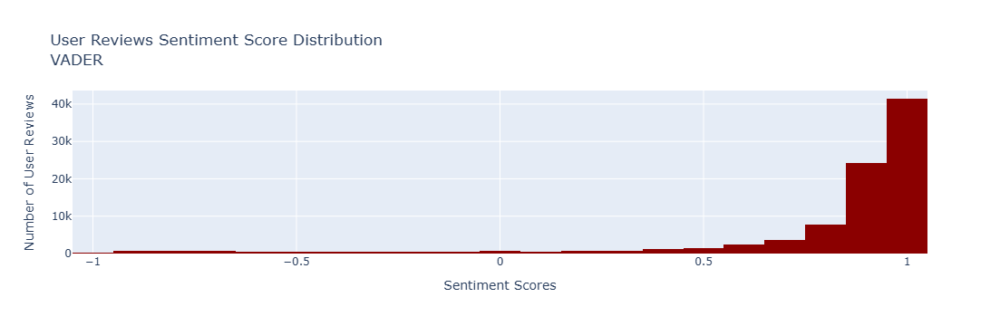

In [7]:
# Plotting the distribution of sentiment scores computed using vaderSentiment
# Histogram
fig = px.histogram(user_reviews_df['sentiment_score_vader'], nbins=20, color_discrete_sequence=['darkred'], title = 'User Reviews Sentiment Score Distribution<br>VADER')

# Remove legend
fig.update_traces(showlegend=False)

# Customize the layout if needed
fig.update_layout(
    xaxis_title = 'Sentiment Scores',
    yaxis_title = 'Number of User Reviews',
    bargap = 0,
    xaxis_showgrid=True
)

# Show the plot
fig.show()

# Saving plot to png file
fig.write_image('figures/user_reviews_sentiment_scores_vader.png')

In [8]:
# Computing sentiment scores using TextBlob
# Function to initialize TextBlob and compute sentiment scores
def getTextBlob(text):
    blob = TextBlob(text)
    sentiment_score = blob.sentiment.polarity
    return sentiment_score

start_time = time.time()
user_reviews_df['sentiment_score_TextBlob'] = user_reviews_df['review_cleaned'].apply(getTextBlob)
end_time = time.time()

print(f"Runtime: {end_time - start_time} seconds")

Runtime: 41.50619983673096 seconds


In [9]:
# Plotting the distribution of sentiment scores computed using TextBlob
# Histogram
fig = px.histogram(user_reviews_df['sentiment_score_TextBlob'], nbins=20, color_discrete_sequence=['steelblue'], title = 'User Reviews Sentiment Score Distribution<br>TextBlob')

# Remove legend
fig.update_traces(showlegend=False)

# Customize the layout if needed
fig.update_layout(
    xaxis_title = 'Sentiment Scores',
    yaxis_title = 'Number of User Reviews',
    bargap = 0,
    xaxis_showgrid=True
)

# Show the plot
fig.show()

# Saving plot to png file
fig.write_image('figures/user_reviews_sentiment_scores_TextBlob.png')

In [10]:
## Computing sentiment scores using SentiWordNet
# Function to get WordNet POS tag
def getwordnet_pos(tag):
    if tag.startswith('N'):
        return wn.NOUN
    elif tag.startswith('V'):
        return wn.VERB
    elif tag.startswith('J'):
        return wn.ADJ
    elif tag.startswith('R'):
        return wn.ADV
    else:
        return None

# Function to compute sentiment scores using sentiwordnet
def getSentiWordNet(text):
    tokens = word_tokenize(text)
    pos_tokens = pos_tag(tokens)

    pos_score = 0
    neg_score = 0
    word_count = 0

    # Calculate sentiment score for each word and accumulate pos_score, neg_score, and word_count for each word
    for word, tag in pos_tokens:
        wordnet_pos = getwordnet_pos(tag)
        synsets = wn.synsets(word, pos=wordnet_pos)

        # take the first synset, most common
        if synsets:
            synset = synsets[0]
            senti_synset = swn.senti_synset(synset.name())
            pos_score += senti_synset.pos_score()
            neg_score += senti_synset.neg_score()
            word_count += 1

    # Calculate normalized sentiment score in range [-1, 1] if words were counted
    if word_count > 0:
        sentiment_score = (pos_score - neg_score) / word_count
    else:
        sentiment_score = 0

    return sentiment_score

start_time = time.time()
user_reviews_df['sentiment_score_sentiwordnet'] = user_reviews_df['review_cleaned'].apply(getSentiWordNet)
end_time = time.time()

print(f"Runtime: {end_time - start_time} seconds")

Runtime: 428.6540684700012 seconds


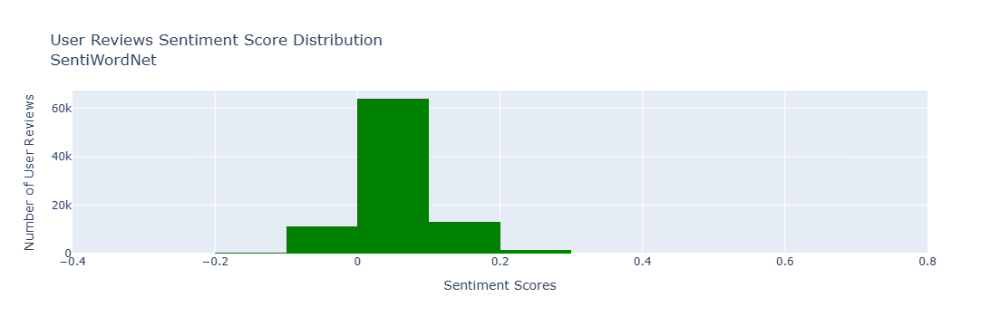

In [11]:
# Plotting the distribution of sentiment scores computed using SentiWordNet
# Histogram
fig = px.histogram(user_reviews_df['sentiment_score_sentiwordnet'], nbins=20, color_discrete_sequence=['green'], title = 'User Reviews Sentiment Score Distribution<br>SentiWordNet')

# Remove legend
fig.update_traces(showlegend=False)

# Customize the layout if needed
fig.update_layout(
    xaxis_title = 'Sentiment Scores',
    yaxis_title = 'Number of User Reviews',
    bargap = 0,
    xaxis_showgrid=True
)

# Show the plot
fig.show()

# Saving plot to png file
fig.write_image('figures/user_reviews_sentiment_scores_sentiwordnet.png')

In [12]:
# Computing average sentiment scores from vaderSentiment and TextBlob for each business_id (restaurant)
avg_sentiment = user_reviews_df.groupby(by = ['business_id'])[['sentiment_score_vader', 'sentiment_score_TextBlob', 'sentiment_score_sentiwordnet']].mean().reset_index()
avg_sentiment.columns = ['business_id', 'avg_sentiment_vader', 'avg_sentiment_TextBlob', 'avg_sentiment_sentiwordnet']

In [13]:
# Counting the number of words in each review
user_reviews_df['review_word_count'] = user_reviews_df['review'].apply(lambda x: len([word for word in word_tokenize(x) if word.isalnum()]))

In [14]:
# Observing columns in user_reviews_df
user_reviews_df.columns

Index(['business_id', 'restaurant_name', 'review_id', 'user_id', 'user_rating',
       'review', 'review_date', 'user_name', 'user_review_count',
       'user_average_rating', 'useful_user_review_count', 'review_cleaned',
       'sentiment_score_vader', 'sentiment_score_TextBlob',
       'sentiment_score_sentiwordnet', 'review_word_count'],
      dtype='object')

In [15]:
## Labeling whether each tweet is positive, negative, or neutral for vaderSentiment and TextBlob
# Labels
labels = ['Positive', 'Neutral', 'Negative']
# Conditions for vaderSentiment
conditions_vader = [
    (user_reviews_df['sentiment_score_vader'] > 0.1), #Positive 
    (user_reviews_df['sentiment_score_vader'] >= -0.1) & (user_reviews_df['sentiment_score_vader'] <= 0.1), #Neutral
    (user_reviews_df['sentiment_score_vader'] < -0.1) #Negative
]

# Conditions for TextBlob
conditions_TextBlob = [
    (user_reviews_df['sentiment_score_TextBlob'] > 0.1), #Positive 
    (user_reviews_df['sentiment_score_TextBlob'] >= -0.1) & (user_reviews_df['sentiment_score_TextBlob'] <= 0.1), #Neutral
    (user_reviews_df['sentiment_score_TextBlob'] < -0.1) #Negative
]

# Conditions for SentiWordNet
conditions_sentiwordnet = [
    (user_reviews_df['sentiment_score_sentiwordnet'] > 0.05), #Positive 
    (user_reviews_df['sentiment_score_sentiwordnet'] >= -0.05) & (user_reviews_df['sentiment_score_sentiwordnet'] <= 0.05), #Neutral
    (user_reviews_df['sentiment_score_sentiwordnet'] < -0.05) #Negative
]

# Applying conditions for each sentiment analysis method
user_reviews_df['sentiment_label_vader'] = np.select(conditions_vader, labels)
user_reviews_df['sentiment_label_TextBlob'] = np.select(conditions_TextBlob, labels)
user_reviews_df['sentiment_label_sentiwordnet'] = np.select(conditions_sentiwordnet, labels)

In [16]:
user_reviews_df['sentiment_label_vader'].value_counts(dropna = False)

sentiment_label_vader
Positive    84145
Negative     4988
Neutral      1258
Name: count, dtype: int64

In [17]:
## Normalizing variables/factors that contribute to the relative importance of a sentiment score
# Normalized user_review_count for each business_id (restaurant); range is [0, 1]
user_reviews_df['norm_user_review_count'] = user_reviews_df.groupby(by = ['business_id'])['user_review_count'].transform(lambda x: x / x.max())

# Normalized useful_user_review_count (number of votes that other users have cast to indicate if the review was helpful) 
# for each business_id (restaurant); range is [0, 1]
user_reviews_df['norm_useful_user_review_count'] = user_reviews_df.groupby(by = ['business_id'])['useful_user_review_count'].transform(lambda x: x / x.max())

# Normalized word count for each business_id (restaurant); range is [0, 1]
user_reviews_df['norm_review_word_count'] = user_reviews_df.groupby(by = ['business_id'])['review_word_count'].transform(lambda x: x / x.max())

# Normalized user rating; range is [0, 1]; closer to 0 means much lower than average rating and 1 means much higher than average rating
min_max_scaler = MinMaxScaler() #scaling deviations to [0,1] range using MinMaxScaler 
user_reviews_df['norm_user_rating'] = min_max_scaler.fit_transform((user_reviews_df['user_rating'] - user_reviews_df['user_average_rating']).values.reshape(-1, 1))


In [18]:
#### Calculating weighted average sentiment score for each business_id (restaurant)
## Assign weights to each variable/factor (you can adjust these based on importance)
weight_user_review_count = 0.2
weight_useful_user_review_count = 0.35
weight_review_word_count = 0.1
weight_user_rating = 0.35

## Calculated weighted sum of variables/factors
user_reviews_df['sentiment_score_weight'] = weight_user_review_count * user_reviews_df['norm_user_review_count'] + \
                                            weight_useful_user_review_count * user_reviews_df['norm_useful_user_review_count'] + \
                                            weight_review_word_count * user_reviews_df['norm_review_word_count'] + \
                                            weight_user_rating * user_reviews_df['norm_user_rating']

## Calculating weighted average sentiment scores for each business_id (restaurant)
# vaderSentiment weighted average sentiment score 
weighted_avg_sentiment_vader = user_reviews_df.groupby('business_id').apply(
    lambda x: (x['sentiment_score_weight'] * x['sentiment_score_vader']).sum() / x['sentiment_score_weight'].sum()
).reset_index(name = 'weighted_avg_sentiment_vader')

# TextBlob weighted average sentiment score
weighted_avg_sentiment_TextBlob = user_reviews_df.groupby('business_id').apply(
    lambda x: (x['sentiment_score_weight'] * x['sentiment_score_TextBlob']).sum() / x['sentiment_score_weight'].sum()
).reset_index(name = 'weighted_avg_sentiment_TextBlob')

# SentiWordNet weighted average sentiment score
weighted_avg_sentiment_sentiwordnet = user_reviews_df.groupby('business_id').apply(
    lambda x: (x['sentiment_score_weight'] * x['sentiment_score_sentiwordnet']).sum() / x['sentiment_score_weight'].sum()
).reset_index(name = 'weighted_avg_sentiment_sentiwordnet')


In [19]:
## Adding the number of positive, neutral, and negative tweets to weighted_avg_sentiment_vader and weighted_avg_sentiment_TextBlob
# vaderSentiment
sentiment_label_count_vader = pd.crosstab(user_reviews_df['business_id'], user_reviews_df['sentiment_label_vader']).reset_index() 
sentiment_label_count_vader.columns = ['business_id', 'negative_review_count_vader', 'neutral_review_count_vader', 'positive_review_count_vader']

# TextBlob
sentiment_label_count_TextBlob = pd.crosstab(user_reviews_df['business_id'], user_reviews_df['sentiment_label_TextBlob']).reset_index() 
sentiment_label_count_TextBlob.columns = ['business_id', 'negative_review_count_TextBlob', 'neutral_review_count_TextBlob', 'positive_review_count_TextBlob']

# SentiWordNet
sentiment_label_count_sentiwordnet = pd.crosstab(user_reviews_df['business_id'], user_reviews_df['sentiment_label_sentiwordnet']).reset_index() 
sentiment_label_count_sentiwordnet.columns = ['business_id', 'negative_review_count_sentiwordnet', 'neutral_review_count_sentiwordnet', 'positive_review_count_sentiwordnet']

In [27]:
sentiment_label_count_vader

,business_id,negative_review_count_vader,neutral_review_count_vader,positive_review_count_vader
0,0RuvlgTnKFbX3IK0ZOOocA,141,36,2556
1,0ak-7uV9Nb7nF_l-mMCysA,9,2,222
2,0oSSjekU-3GR8gselReWnA,21,10,1299
3,1Ck2drCXGh1h5bhc9aIRpg,53,9,518
4,1N7RWvz2c_e640PsvnSc0A,18,5,294
...,...,...,...,...
195,wocwfwSFrNfYJRyfYSi1Cw,15,5,359
196,xb5NsCqvQw2uE5HoQyDr0g,6,8,159
197,xhAzk9qYpHR-nu_0sZIcWg,21,6,179
198,yB2OawAQ_U8qwv7gu1huMg,15,3,193


In [21]:
## Merging everything together
restaurants_sentiment_df = pd.merge(avg_sentiment, weighted_avg_sentiment_vader, how = 'inner', on = 'business_id')
restaurants_sentiment_df = pd.merge(restaurants_sentiment_df, sentiment_label_count_vader, how = 'inner', on = 'business_id')
restaurants_sentiment_df = pd.merge(restaurants_sentiment_df, weighted_avg_sentiment_TextBlob, how = 'inner', on = 'business_id')
restaurants_sentiment_df = pd.merge(restaurants_sentiment_df, sentiment_label_count_TextBlob, how = 'inner', on = 'business_id')
restaurants_sentiment_df = pd.merge(restaurants_sentiment_df, weighted_avg_sentiment_sentiwordnet, how = 'inner', on = 'business_id')
restaurants_sentiment_df = pd.merge(restaurants_sentiment_df, sentiment_label_count_sentiwordnet, how = 'inner', on = 'business_id')

In [22]:
restaurants_sentiment_df

,business_id,avg_sentiment_vader,avg_sentiment_TextBlob,avg_sentiment_sentiwordnet,weighted_avg_sentiment_vader,negative_review_count_vader,neutral_review_count_vader,positive_review_count_vader,weighted_avg_sentiment_TextBlob,negative_review_count_TextBlob,neutral_review_count_TextBlob,positive_review_count_TextBlob,weighted_avg_sentiment_sentiwordnet,negative_review_count_sentiwordnet,neutral_review_count_sentiwordnet,positive_review_count_sentiwordnet
0,0RuvlgTnKFbX3IK0ZOOocA,0.790591,0.253403,0.045558,0.826302,141,36,2556,0.267241,103,413,2217,0.047751,60,1548,1125
1,0ak-7uV9Nb7nF_l-mMCysA,0.809788,0.281473,0.037805,0.832519,9,2,222,0.288632,1,33,199,0.038139,13,124,96
2,0oSSjekU-3GR8gselReWnA,0.893755,0.370201,0.057236,0.910556,21,10,1299,0.375257,12,69,1249,0.057444,9,646,675
3,1Ck2drCXGh1h5bhc9aIRpg,0.730654,0.239099,0.043276,0.791602,53,9,518,0.274821,41,108,431,0.048337,20,328,232
4,1N7RWvz2c_e640PsvnSc0A,0.774791,0.256962,0.053668,0.799180,18,5,294,0.262789,9,53,255,0.054965,3,171,143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,wocwfwSFrNfYJRyfYSi1Cw,0.821203,0.299087,0.055827,0.855047,15,5,359,0.311814,13,36,330,0.057337,10,167,202
196,xb5NsCqvQw2uE5HoQyDr0g,0.745088,0.345355,0.056566,0.766047,6,8,159,0.345934,4,17,152,0.055615,1,91,81
197,xhAzk9qYpHR-nu_0sZIcWg,0.673271,0.162024,0.037055,0.747420,21,6,179,0.189158,22,48,136,0.039350,8,124,74
198,yB2OawAQ_U8qwv7gu1huMg,0.725571,0.232205,0.040468,0.775074,15,3,193,0.245701,8,39,164,0.041553,9,126,76


In [23]:
print(f"weighted average sentiment vader: {restaurants_sentiment_df['weighted_avg_sentiment_vader'].mean()}")
print(f"arithmetic mean sentiment vader: {restaurants_sentiment_df['avg_sentiment_vader'].mean()}")

weighted average sentiment vader: 0.8184386342544278
arithmetic mean sentiment vader: 0.7765014333528621


In [24]:
print(f"weighted average sentiment TextBlob: {restaurants_sentiment_df['weighted_avg_sentiment_TextBlob'].mean()}")
print(f"arithmetic mean sentiment TextBlob: {restaurants_sentiment_df['avg_sentiment_TextBlob'].mean()}")

weighted average sentiment TextBlob: 0.28900556662022553
arithmetic mean sentiment TextBlob: 0.27472251243265045


In [25]:
print(f"weighted average sentiment SentiWordNet: {restaurants_sentiment_df['weighted_avg_sentiment_sentiwordnet'].mean()}")
print(f"arithmetic mean sentiment SentiWordNet: {restaurants_sentiment_df['avg_sentiment_sentiwordnet'].mean()}")

weighted average sentiment SentiWordNet: 0.05237636224110638
arithmetic mean sentiment SentiWordNet: 0.050481691424740696


In [32]:
## Writing out sentiment for each review
# Grabbing relevant columns
user_reviews_df_upload = user_reviews_df[['business_id', 'restaurant_name', 'review_id', 'user_id', 'user_rating', 'review', 'review_date', \
'user_review_count', 'review_cleaned', 'review_word_count', 'sentiment_score_vader', 'sentiment_label_vader', 'sentiment_score_TextBlob', \
'sentiment_label_TextBlob', 'sentiment_score_sentiwordnet', 'sentiment_label_sentiwordnet']]

# Writing to csv file
user_reviews_df_upload.to_csv('data/yelp_reviews_lexicon_sentiment_analysis_Phila.csv', index = False)

In [26]:
# Writing out restaurants_sentiment_df
restaurants_sentiment_df.to_csv('data/yelp_restaurants_lexicon_sentiment_Phila.csv', index = False)